In [49]:
import tensorflow as tf
from tensorflow.keras import layers, losses, Model, optimizers, utils, preprocessing
import os
from matplotlib import pyplot as plt

In [50]:
from IPython.display import display

# Get Dataset

In [51]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

In [52]:
crop_size = 300
upscale_factor = 3
# input_size = crop_size // upscale_factor
input_size = crop_size
batch_size = 32

train_ds = preprocessing.image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = preprocessing.image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


# Preprocessing the images

In [53]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

In [54]:
# for batch in train_ds.take(1):
#     for img in batch:
#         display(utils.array_to_img(img))

In [55]:
def process_input(input, input_size, upscale_factor):
    downsample = tf.image.resize(input, [input_size//upscale_factor, input_size//upscale_factor], method="area")
    interpolate =  tf.image.resize(downsample, [input_size, input_size], method="bicubic")
    return interpolate

def process_target(input):
    # Identity mapping
    return input

train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

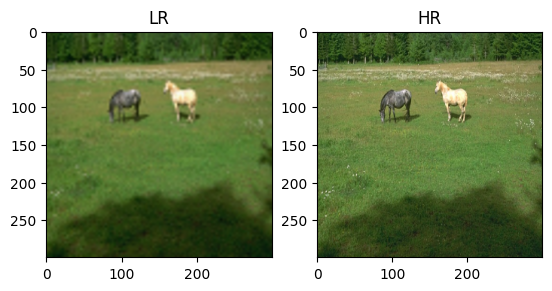

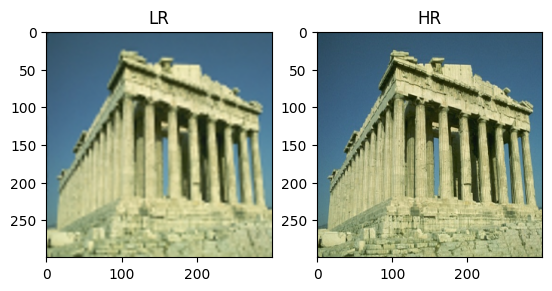

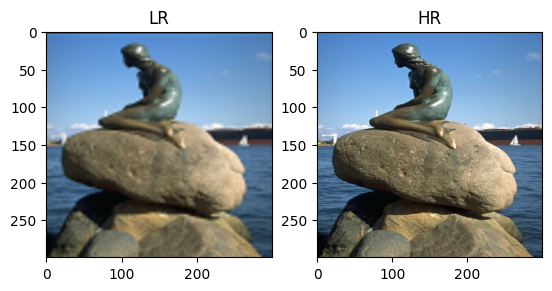

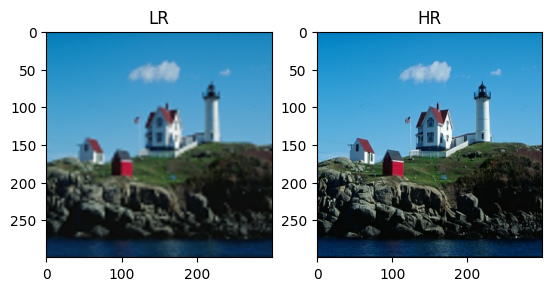

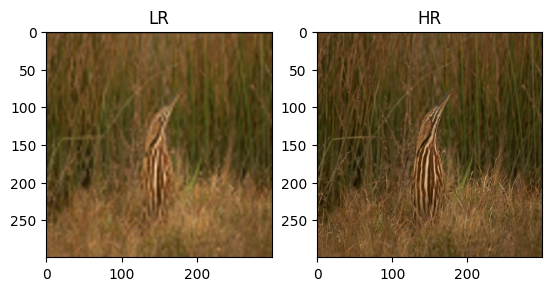

...

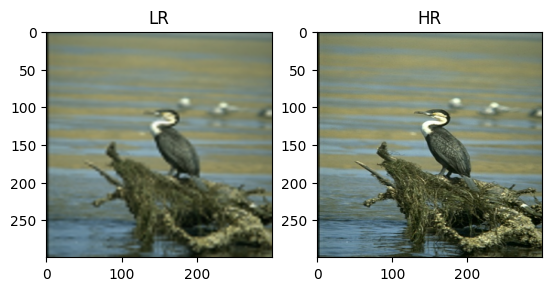

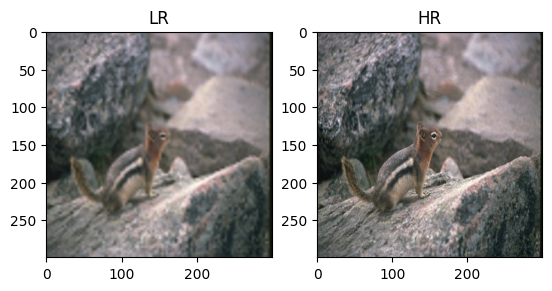

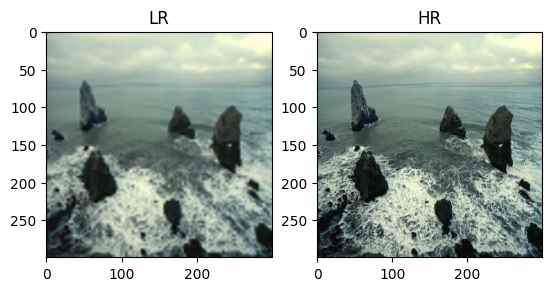

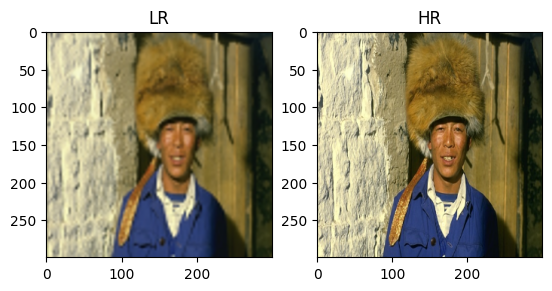

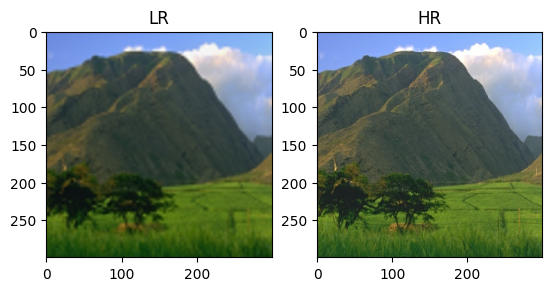

In [56]:
for batch in train_ds.take(1):
    for lr, hr in zip(batch[0], batch[1]):
        plt.subplot(1, 2, 1)
        plt.title("LR")
        plt.imshow(utils.array_to_img(lr))
        
        plt.subplot(1, 2, 2)
        plt.title("HR")
        plt.imshow(utils.array_to_img(hr))
        plt.show()
    # for img in batch[0]:
    #     display(utils.array_to_img(img))
    # for img in batch[1]:
    #     display(utils.array_to_img(img))

# Model

In [57]:
# As proposed by the authors
def get_model():
    SRCNN=tf.keras.models.Sequential([
        layers.Input((None, None, 3)),
        layers.Conv2D(64,9,padding='same', activation='relu'),
        layers.Conv2D(32,1,padding='same',activation='relu'),
        layers.Conv2D(3,5,padding='same',activation='linear')
    ])
    # SRCNN.summary()
    return SRCNN

In [58]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL
import numpy as np


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = utils.img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    # x1, x2, y1, y2 = 60, 80, 40, 60
    x1, x2, y1, y2 = 200, 300, 100, 200

    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    
    y = utils.img_to_array(img)
    y = y.astype("float32") / 255.0

    input = tf.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    return out_img_y

In [59]:
root_dir

'/Users/raunavghosh/.keras/datasets/BSR/BSDS500/data'

In [60]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [61]:
test_img_paths[:3]

['/Users/raunavghosh/.keras/datasets/BSR/BSDS500/data/images/test/100007.jpg',
 '/Users/raunavghosh/.keras/datasets/BSR/BSDS500/data/images/test/100039.jpg',
 '/Users/raunavghosh/.keras/datasets/BSR/BSDS500/data/images/test/100099.jpg']

In [62]:
class SRCNNCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        img = utils.load_img(test_img_paths[0])
        lowres_input = get_lowres_image(img, upscale_factor)#downscale
        w = lowres_input.size[0] * upscale_factor
        h = lowres_input.size[1] * upscale_factor
        lowres_img = lowres_input.resize((w, h)) #interpolate
        self.test_img = lowres_img

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * np.log10(1 / logs["loss"]))

In [63]:
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model()
model.summary()

callbacks = [SRCNNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = tf.keras.losses.MeanSquaredError()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, None, None, 64)    15616     
                                                                 
 conv2d_10 (Conv2D)          (None, None, None, 32)    2080      
                                                                 
 conv2d_11 (Conv2D)          (None, None, None, 3)     2403      
                                                                 
Total params: 20,099
Trainable params: 20,099
Non-trainable params: 0
_________________________________________________________________


In [64]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

# model.fit(
#     train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
# )

# The model weights (that are considered the best) are loaded into the model.
# model.load_weights(checkpoint_filepath)

In [65]:
# model.save("./srcnn_trained.h5")
model = tf.keras.models.load_model("./srcnn_trained.h5")

1/1 [==============================] - 0s 201ms/step


2023-05-24 12:40:23.890735: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


287.66846 9.253565
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 29.9921


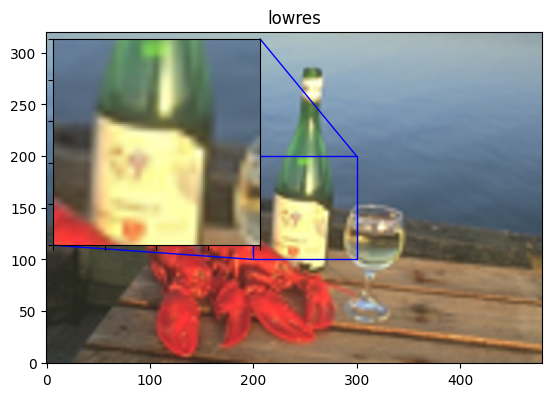

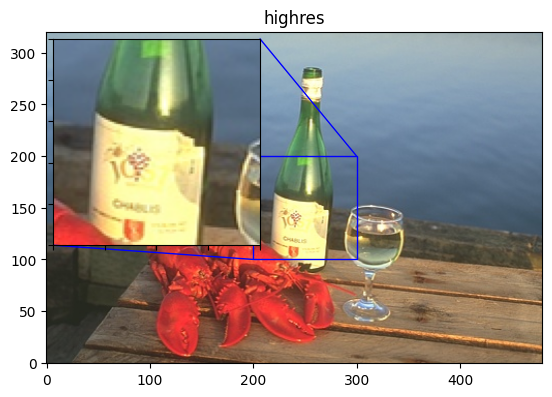

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


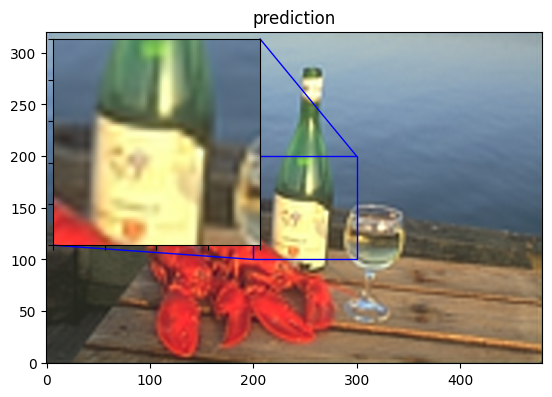

1/1 [==============================] - 0s 10ms/step
303.6112 20.517574
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 25.3454


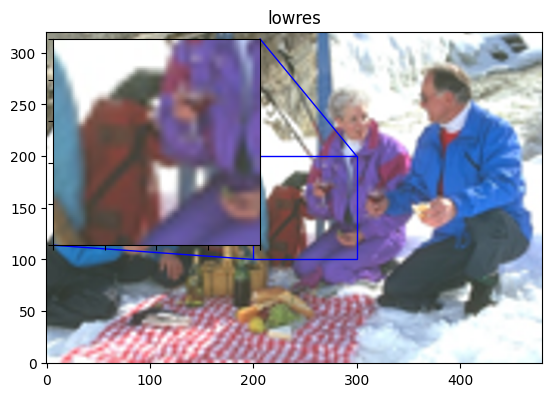

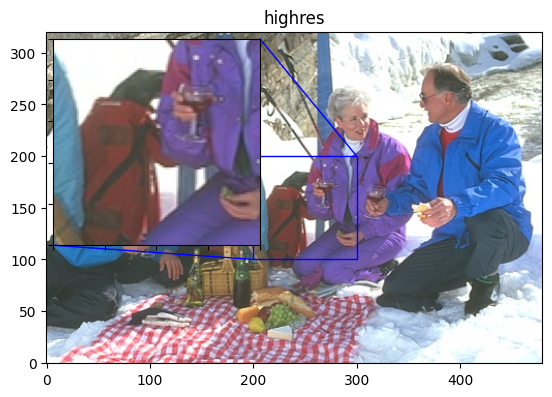

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


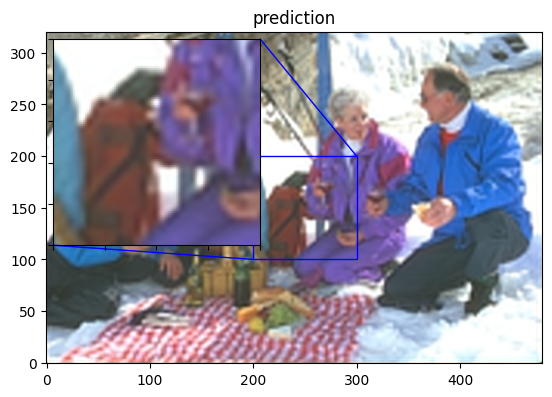

1/1 [==============================] - 0s 135ms/step
300.1241 -17.525343
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.1371


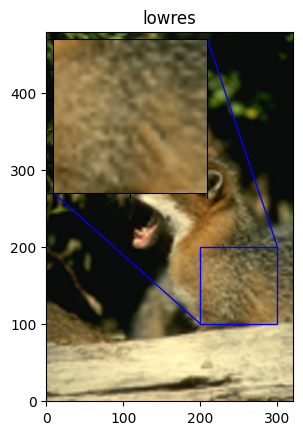

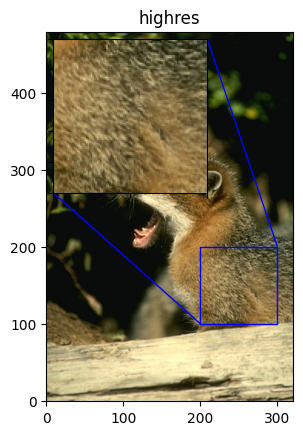

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


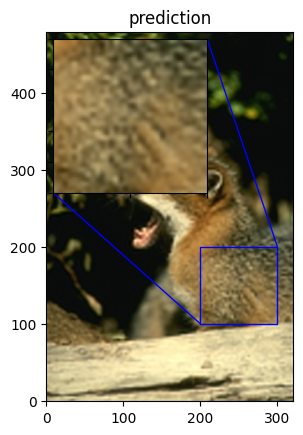

1/1 [==============================] - 0s 10ms/step
254.30934 -12.015339
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2023


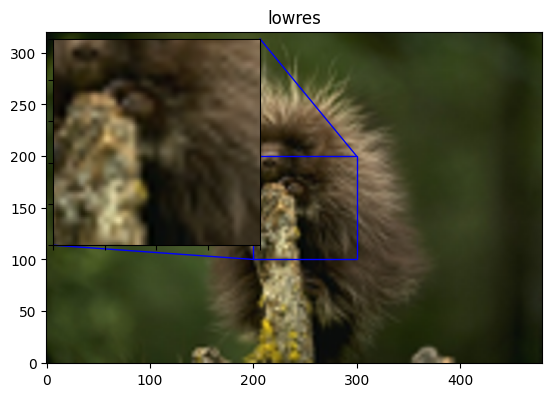

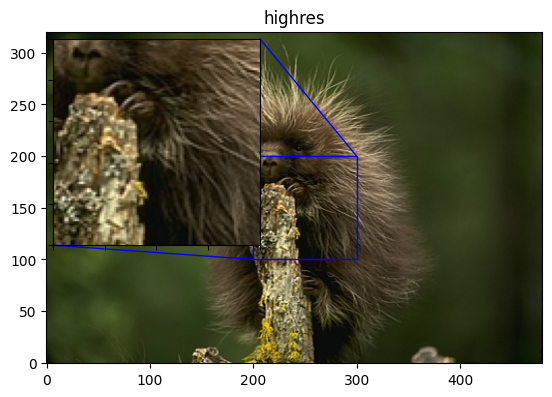

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


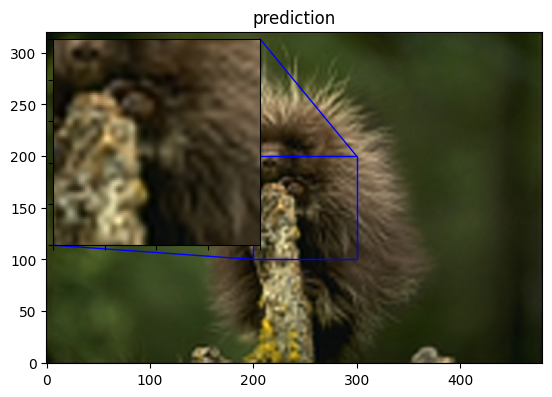

1/1 [==============================] - 0s 10ms/step
280.25073 2.9324455
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.0542


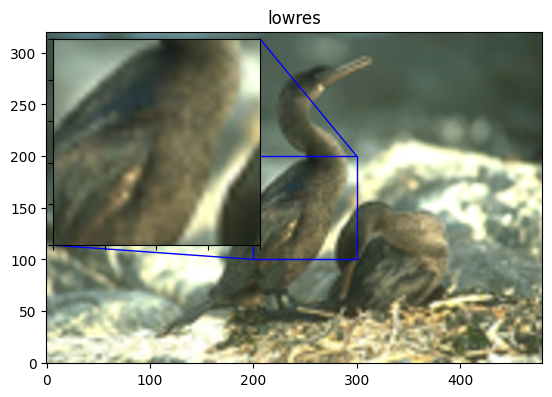

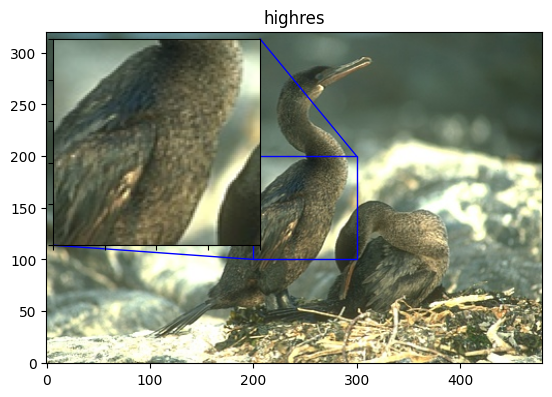

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


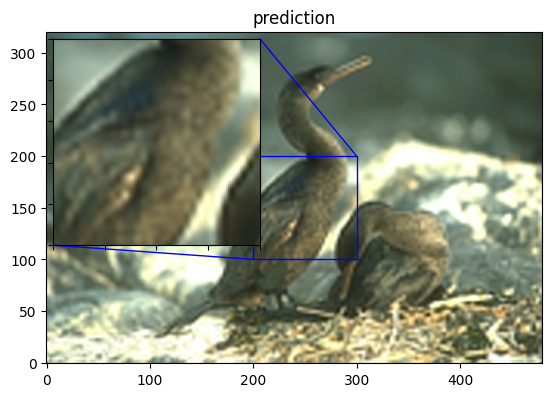

1/1 [==============================] - 0s 10ms/step
302.47552 -29.843218
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.0569


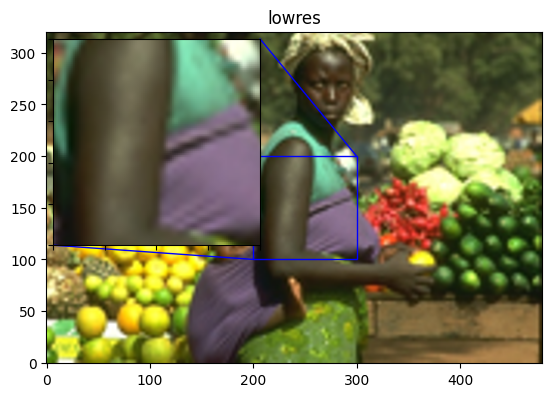

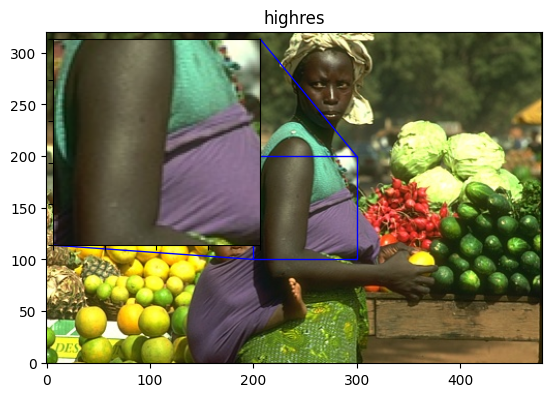

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


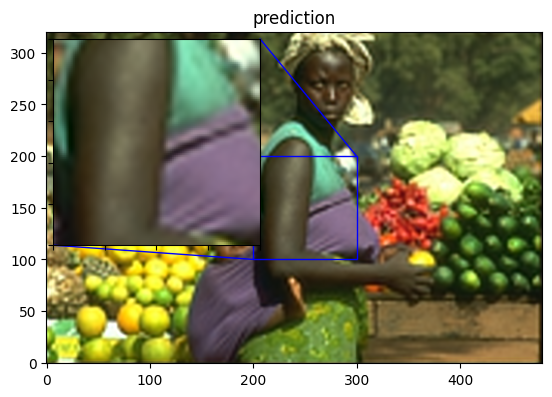

1/1 [==============================] - 0s 10ms/step
278.73138 -10.543068
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 26.6887


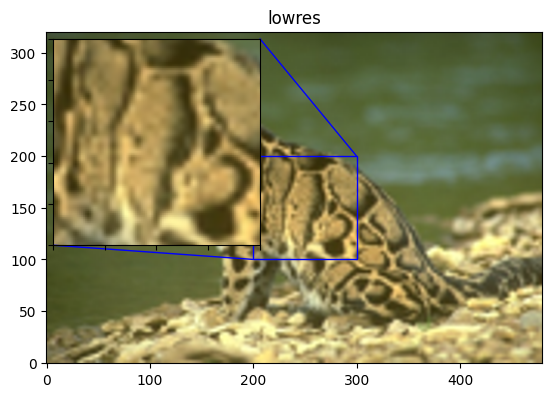

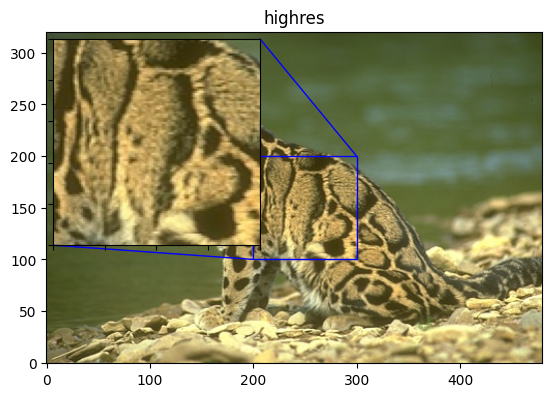

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


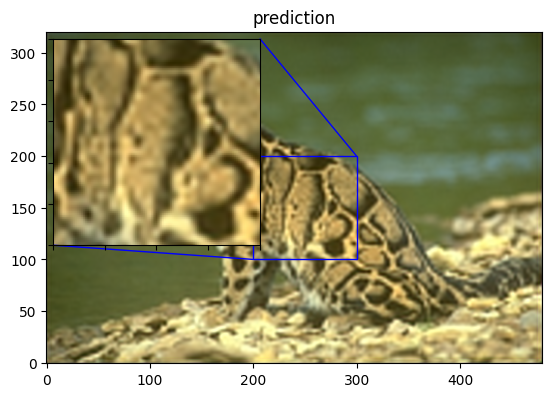

1/1 [==============================] - 0s 11ms/step
286.13498 2.723202
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 23.8557


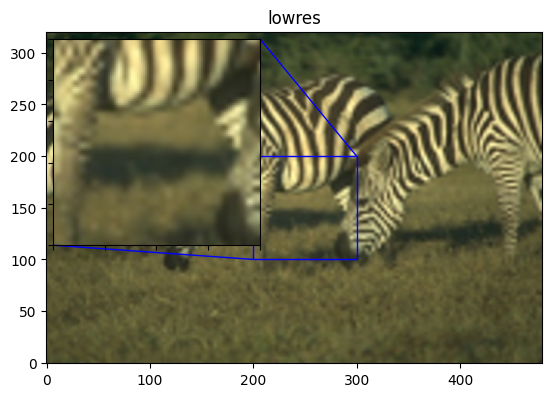

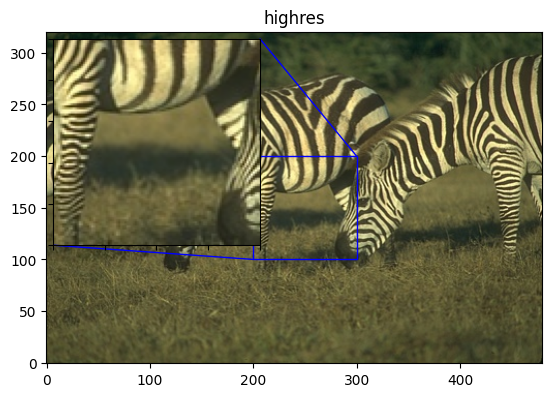

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


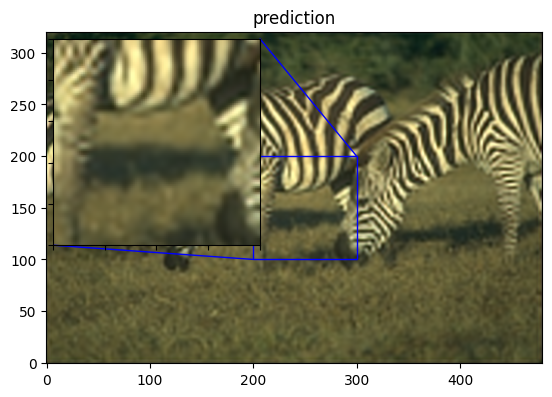

1/1 [==============================] - 0s 10ms/step
192.51564 -9.002367
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.0939


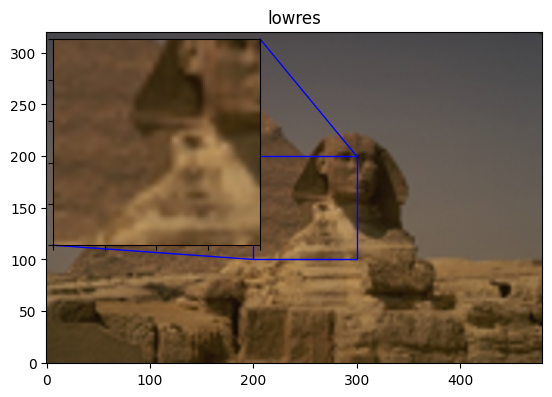

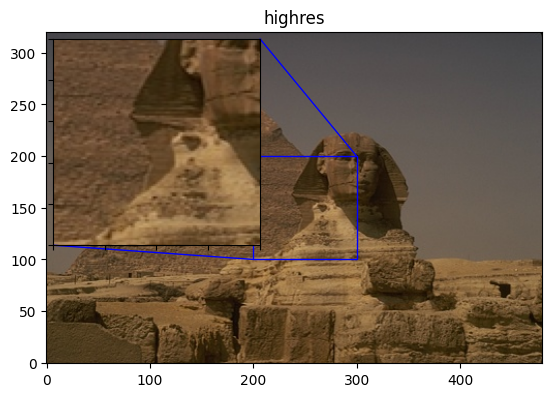

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


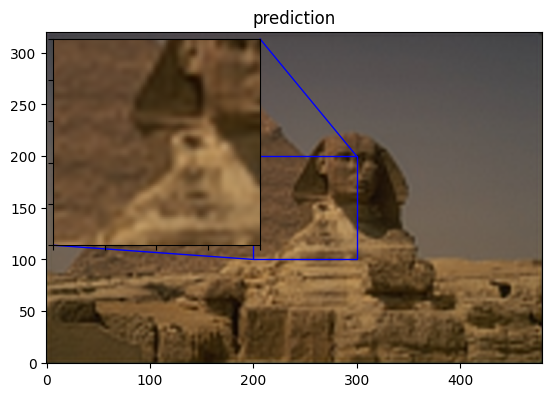

1/1 [==============================] - 0s 10ms/step
283.16537 -24.546228
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.4323


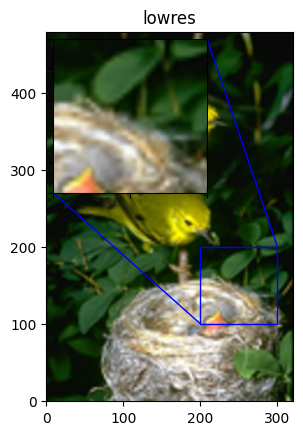

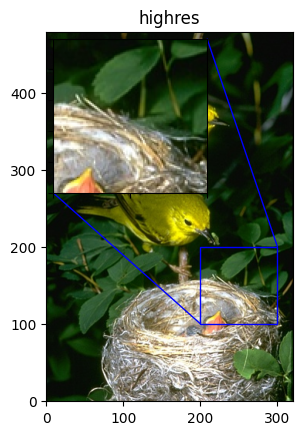

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


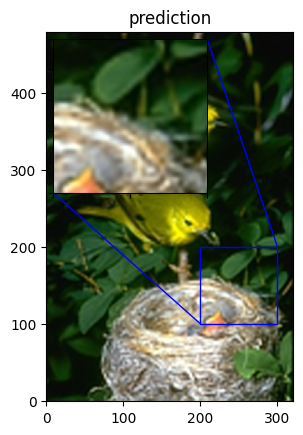

Avg. PSNR of lowres images is 26.7357
Avg. SSIM of lowres images is 0.8208
Avg. PSNR of reconstructions is 26.9859
Avg. SSIM of reconstructions is 0.8323


In [67]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0
total_bicubic_ssim = 0
total_test_ssim = 0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = utils.load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    lowres_img = lowres_input.resize((w, h))
    lowres_input_arr = utils.img_to_array(lowres_img)
    prediction = upscale_image(model, lowres_input_arr)
    lowres_img_arr = utils.img_to_array(lowres_img)
    highres_img_arr = utils.img_to_array(highres_img)
    predict_img_arr = utils.img_to_array(prediction)
    print(np.max(predict_img_arr), np.min(predict_img_arr))
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    bicubic_ssim = tf.image.ssim(lowres_img_arr, highres_img_arr, max_val=255)
    # print(lowres_img_arr.shape, highres_img_arr.shape)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)
    test_ssim = tf.image.ssim(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    total_bicubic_ssim += bicubic_ssim
    total_test_ssim += test_ssim


    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. SSIM of lowres images is %.4f" % (total_bicubic_ssim / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))
print("Avg. SSIM of reconstructions is %.4f" % (total_test_ssim / 10))